In [1]:
%reset -f
import numpy
import numpy as np

# imports
import numpy as np                     # numeric python lib
import matplotlib.image as mpimg       # reading images to numpy arrays
import matplotlib.pyplot as plt        # to plot any graph
import matplotlib.patches as mpatches  # to draw a circle at the mean contour
import scipy.ndimage as ndi            # to determine shape centrality

from pylab import rcParams
rcParams['figure.figsize'] = (6, 6)      # setting default size of plots

import tensorflow as tf 
print("tensorflow:" + tf.__version__)
!set "KERAS_BACKEND=tensorflow"


# import cv2


from PIL import Image, ImageFilter
from matplotlib.pyplot import imshow

import matplotlib.cm as colormap   # Library to plot
import PIL
import time
%matplotlib inline

2024-02-17 01:50:56.559667: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-02-17 01:50:56.984617: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-02-17 01:50:56.984673: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-02-17 01:50:57.069679: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-02-17 01:50:57.226449: I tensorflow/core/platform/cpu_feature_guar

tensorflow:2.15.0


In [2]:
from pycuda.compiler import SourceModule
import pycuda
from pycuda import compiler
import pycuda.driver as cuda
import pycuda.autoinit             # PyCuda autoinit
import pycuda.driver as cuda       # PyCuda In, Out helpers
import matplotlib.pyplot as plot   # Library to plot
import matplotlib.cm as colormap   # Library to plot
import numpy                       # Fast math library
import time
print("%d device(s) found." % cuda.Device.count())           
for ordinal in range(cuda.Device.count()):
    dev = cuda.Device(ordinal)
    print ("Device #%d: %s" % (ordinal, dev.name()))
print (cuda)

1 device(s) found.
Device #0: NVIDIA GeForce RTX 3060 Laptop GPU
<module 'pycuda.driver' from '/home/etin_l/.pyenv/versions/3.10.6/envs/Evolution_generated_images/lib/python3.10/site-packages/pycuda/driver.py'>


In [83]:
#Kernel text
kernel = """
 
    __global__ void bw( float *inIm, int check ){
 
        int idx = (threadIdx.x ) + blockDim.x * blockIdx.x ;
 
        if(idx *3 < check*3)
        {
        //int val = 0.21 *inIm[idx*3] + 0.71*inIm[idx*3+1] + 0.07 * inIm[idx*3+2];
        int val = 255.0;
 
        //inIm[idx*3]= val;
        //inIm[idx*3+1]= val;
        inIm[idx*3+2]= val;
        }
    }
    """
 
#Compile and get kernel function
mod = SourceModule(kernel)
print(mod)
func = mod.get_function("bw")
print(func)

In [84]:
def filterImageOnGPU(inPath, filterFunc):              
    im = Image.open(inPath)            
    px = numpy.array(im).astype(numpy.float32)
        
    print('Size:' + str(im.size))
    print('Pixels:' + str (im.size[0]*im.size[1]))
    
    d_px = cuda.mem_alloc(px.nbytes)
    cuda.memcpy_htod(d_px, px)
      
    BLOCK_SIZE = 1024
    block = (BLOCK_SIZE,1,1)
    print ('Block:' + str (block))
    totalPixels = numpy.int32(im.size[0]*im.size[1])
    print ('TotalPixels:' + str (totalPixels))
    gridRounded=int(im.size[0]*im.size[1]/BLOCK_SIZE)+1
    print ('GridRounded:' + str (gridRounded))
    print ('BLOCK_SIZE * GridRounded:' + str (gridRounded*BLOCK_SIZE))
    grid = (gridRounded,1,1)
    print ('Grid:' + str (grid))
   
    filterFunc(d_px,totalPixels, block=block,grid = grid)
   
    bwPx = numpy.empty_like(px)
    cuda.memcpy_dtoh(bwPx, d_px)
    # On monochrome images, Pixels are uint8 [0,255].    
#     numpy.clip(bwPx, 0, 255, out=bwPx)
#     bwPx = bwPx.astype('uint8')
    bwPx = (numpy.uint8(bwPx))       
    pil_im = Image.fromarray(bwPx,mode ="RGB")           
    return pil_im

In [6]:
import sys
start_time=0.0

def startTimer(funcname):
    global start_time    
    print(funcname)        
    start_time = time.time()
        
def stopTimer():
    elapsed_time = time.time() - start_time    
    print('DONE in {0:.8f} seconds.'.format(elapsed_time))

filterImageOnGPU
Size:(2000, 1333)
Pixels:2666000
Block:(1024, 1, 1)
TotalPixels:2666000
GridRounded:2604
BLOCK_SIZE * GridRounded:2666496
Grid:(2604, 1, 1)
DONE in 0.55867195 seconds.


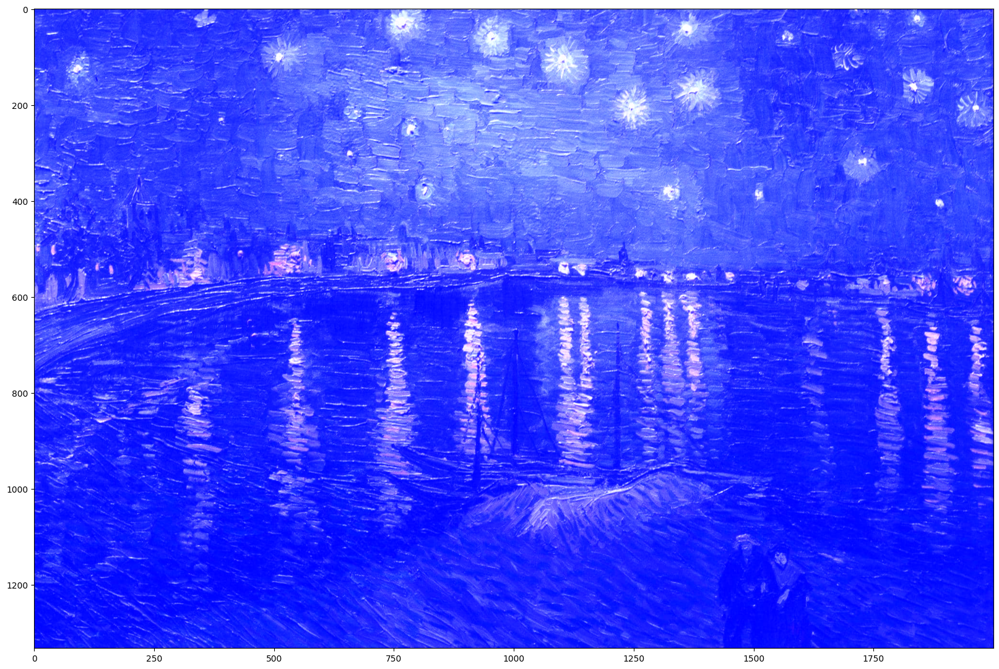

In [6]:
startTimer('filterImageOnGPU')
figure = plt.figure()
figure.set_size_inches(20, 20)
imshow(filterImageOnGPU('raw_data/vangogh2.jpg',func))
stopTimer()  

# draw circle on images in gpu

In [3]:
#Kernel text
kernel_circledrawing = """
 
    __global__ void draw_circle( float *testIm, float *targetIm, float *score, int nbr_circles, int check, float *x_coordinates, float *y_coordinates, float *radius, int im_size){
        
        for(int c = 0; c < nbr_circles; c++){
            
            float color[3]{0,0,0};
            // getting color
            int count = 0;
            int id = (y_coordinates[c])*im_size + x_coordinates[c];
            color[0] = color[0] + targetIm[3*id];
            color[1] = color[1] + targetIm[3*id+1];
            color[2] = color[2] + targetIm[3*id+2];
            count++;
            for(int i = 0; i<radius[c]; i++){
                for(int j = 0; j<radius[c]; j++){
                    
                    int id = (y_coordinates[c]+j)*im_size + x_coordinates[c]+i;
                    if (i*i+j*j<radius[c]*radius[c] && id < check && id > 0){
                      
                      color[0] = color[0] + targetIm[3*id];
                      color[1] = color[1] + targetIm[3*id+1];
                      color[2] = color[2] + targetIm[3*id+2];
                      count++;
                      }
                    id = (y_coordinates[c]-j)*im_size + x_coordinates[c]+i;
                    if (i*i+j*j<radius[c]*radius[c] && id < check && id > 0){
                      
                      color[0] = color[0] + targetIm[3*id];
                      color[1] = color[1] + targetIm[3*id+1];
                      color[2] = color[2] + targetIm[3*id+2];
                      count++;
                      }
                    id = (y_coordinates[c]-j)*im_size + x_coordinates[c]-i;
                    if (i*i+j*j<radius[c]*radius[c]  && id < check && id > 0){
                      
                      color[0] = color[0] + targetIm[3*id];
                      color[1] = color[1] + targetIm[3*id+1];
                      color[2] = color[2] + targetIm[3*id+2];
                      count++;
                      }
                    id = (y_coordinates[c]+j)*im_size + x_coordinates[c]-i;
                    if (i*i+j*j<radius[c]*radius[c] && id < check && id > 0){
                      
                      color[0] = color[0] + targetIm[3*id];
                      color[1] = color[1] + targetIm[3*id+1];
                      color[2] = color[2] + targetIm[3*id+2];
                      count++;
                      }
                }
        	}
            color[0] = color[0]/count;
            color[1] = color[1] / count;
            color[2] = color[2] / count;
 
            int idx = (threadIdx.x ) + blockDim.x * blockIdx.x ;
            int pixel_y = idx / im_size ;
            int pixel_x = idx % im_size ;
            float dist_from_center = (pixel_x-x_coordinates[c])*(pixel_x-x_coordinates[c]) + (pixel_y-y_coordinates[c])*(pixel_y-y_coordinates[c]) ;
            if(idx *3 < check*3 && dist_from_center < radius[c]*radius[c])
            {
     
            //assign color

            //float color_swap[3]{testIm[idx*3],testIm[idx*3+1],testIm[idx*3+2]};
            
            testIm[idx*3]= color[0];
            testIm[idx*3+1]= color[1];
            testIm[idx*3+2]= color[2];
            
            score[c] = score[c] + abs(testIm[idx*3]-targetIm[idx*3])+abs(testIm[idx*3+1]-targetIm[idx*3+1])+abs(testIm[idx*3+2]-targetIm[idx*3+2]);

            //testIm[idx*3]= color_swap[0];
            //testIm[idx*3+1]= color_swap[1];
            //testIm[idx*3+2]= color_swap[2];
            }
            else { score[c] = score[c] + abs(testIm[idx*3]-targetIm[idx*3])+abs(testIm[idx*3+1]-targetIm[idx*3+1])+abs(testIm[idx*3+2]-targetIm[idx*3+2]); }
        }
        }

    """

 
#Compile and get kernel function
mod = SourceModule(kernel_circledrawing)
print(mod)
circle_func = mod.get_function("draw_circle")
print(circle_func)

In [9]:
def daw_circle_onImageOnGPU(targetIm, testIm, circleFunc, Nbr_circles):

    score = numpy.zeros((Nbr_circles)).astype(numpy.float32)
    score_gpu = cuda.mem_alloc(score.nbytes)
    cuda.memcpy_htod(score_gpu, score)
              
    px_target = numpy.array(targetIm).astype(numpy.float32)
    d_px_target = cuda.mem_alloc(px_target.nbytes)
    cuda.memcpy_htod(d_px_target, px_target)

    px_test = numpy.array(testIm).astype(numpy.float32)
    d_px_test = cuda.mem_alloc(px_test.nbytes)
    cuda.memcpy_htod(d_px_test, px_test)

    random_x = [numpy.int32(x) for x in list(np.random.rand(Nbr_circles)*targetIm.shape[0])]
    x_coordinates = numpy.array(random_x).astype(numpy.float32)
    print(x_coordinates)
    x_coord = cuda.mem_alloc(x_coordinates.nbytes)
    cuda.memcpy_htod(x_coord,x_coordinates)

    random_y = [np.int32(x) for x in list(np.random.rand(Nbr_circles)*targetIm.shape[1])]
    y_coordinates = numpy.array(random_y).astype(numpy.float32)
    print(y_coordinates)
    y_coord = cuda.mem_alloc(y_coordinates.nbytes)
    cuda.memcpy_htod(y_coord,y_coordinates)
    
    random_rad = np.random.rand(Nbr_circles)*10 + np.ones(Nbr_circles)*100
    radius = random_rad.astype(numpy.float32)
    print(radius)
    radius_cuda = cuda.mem_alloc(radius.nbytes)
    cuda.memcpy_htod(radius_cuda,radius)
      
    BLOCK_SIZE = 1024
    block = (BLOCK_SIZE,1,1)
    print ('Block:' + str (block))
    totalPixels = numpy.int32(targetIm.shape[0]*targetIm.shape[1])
    print ('TotalPixels:' + str (totalPixels))
    gridRounded=int(targetIm.shape[0]*targetIm.shape[1]/BLOCK_SIZE)+1
    print ('GridRounded:' + str (gridRounded))
    print ('BLOCK_SIZE * GridRounded:' + str (gridRounded*BLOCK_SIZE))
    grid = (gridRounded,1,1)
    print ('Grid:' + str (grid))

    circleFunc(d_px_test, d_px_target, score_gpu, numpy.int32(Nbr_circles), totalPixels, x_coord, y_coord, radius_cuda, numpy.int32(targetIm.shape[1]) ,block=block,grid = grid)
   
    bwPx = numpy.empty_like(px_target)
    cuda.memcpy_dtoh(bwPx, d_px_test)
    
    cuda.memcpy_dtoh(score, score_gpu)
    # On monochrome images, Pixels are uint8 [0,255].    
#     numpy.clip(bwPx, 0, 255, out=bwPx)
    # bwPx = bwPx.astype('uint8')
    bwPx = (numpy.uint8(bwPx))       
    pil_im = Image.fromarray(bwPx,mode ="RGB")           
    return score, pil_im

filterImageOnGPU
[  52.  104.  824.  902. 1160.  152. 1322. 1310.  496.  433. 1184.  833.
  767.  344.  805.  239.  231.  956. 1053.  949.]
[  88. 1782.  260. 1577.  116. 1943.  968. 1734.  151. 1422. 1739. 1355.
 1634. 1271.  157. 1275. 1566. 1352.  940.  726.]
[109.00683  104.47342  107.90514  105.467125 106.58455  105.01118
 101.72788  102.0603   102.57799  105.37297  101.644936 101.38029
 103.29225  102.08693  105.8035   104.96439  100.129234 105.11709
 103.31162  105.15454 ]
Block:(1024, 1, 1)
TotalPixels:2666000
GridRounded:2604
BLOCK_SIZE * GridRounded:2666496
Grid:(2604, 1, 1)
[  8994.249  14119.593  34179.883  36807.832 122138.1   119844.664
 240944.1   250098.36  280155.66   83965.125  80945.51  216880.22
 329974.34  415340.8   488690.47  510974.56  512970.5   512183.6
 609795.5   626863.75 ]
DONE in 8.92632437 seconds.


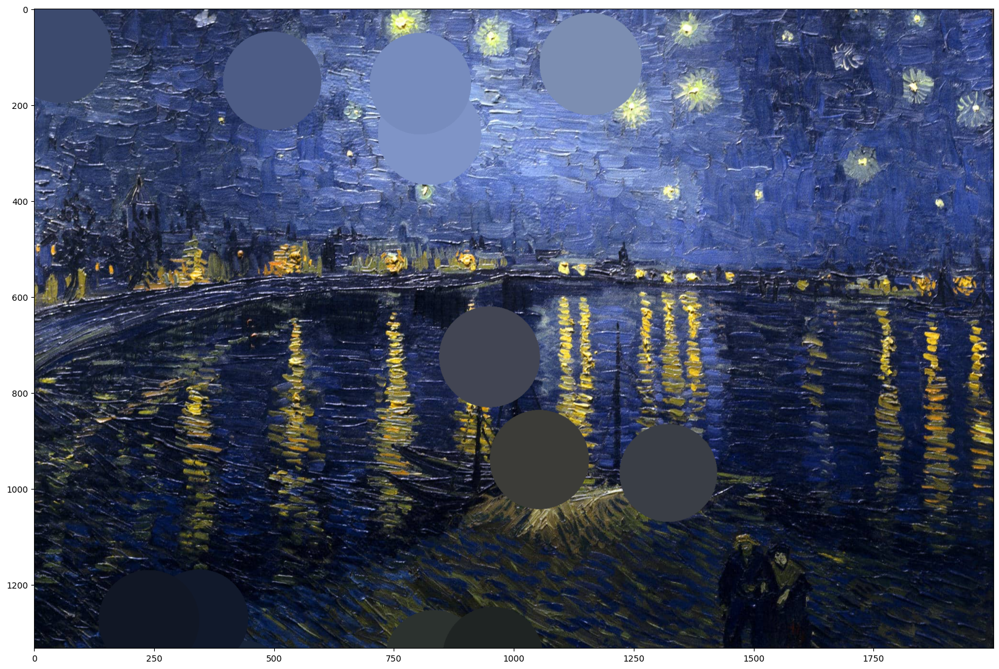

In [10]:
startTimer('filterImageOnGPU')
figure = plt.figure()
figure.set_size_inches(20, 20)
im = np.array(Image.open('raw_data/vangogh2.jpg'))
# im = numpy.zeros((1300,2000,3)).astype(numpy.float32)
score, pil_im = daw_circle_onImageOnGPU(im,im,circle_func,20)
print(score)
imshow(pil_im)
# print(targetPx[:,:,2])
stopTimer()  

In [20]:
kernel_draw_circle = """
    
    __global__ void draw_circle(float *targetIm, float *testIm, int check, float *coordinates, float radius, int im_size){
        int idx = (threadIdx.x ) + blockDim.x * blockIdx.x ;
        int pixel_y = idx / im_size ;
        int pixel_x = idx % im_size ;
        float dist_from_center = (pixel_x-coordinates[0])*(pixel_x-coordinates[0]) + (pixel_y-coordinates[1])*(pixel_y-coordinates[1]) ;
        float color[3]{0,0,0};
        // getting color
        int count = 0;
        int id = (coordinates[1])*im_size + coordinates[0];
        color[0] = color[0] + targetIm[3*id];
        color[1] = color[1] + targetIm[3*id+1];
        color[2] = color[2] + targetIm[3*id+2];
        count++;
        for(int i = 0; i<100; i++){
            for(int j = 0; j<100; j++){
                
                int id = (coordinates[1]+j)*im_size + coordinates[0]+i;
                if (i*i+j*j<radius*radius && id < check){
                  
                  color[0] = color[0] + targetIm[3*id];
                  color[1] = color[1] + targetIm[3*id+1];
                  color[2] = color[2] + targetIm[3*id+2];
                  count++;
                  }
                id = (coordinates[1]-j)*im_size + coordinates[0]+i;
                if (i*i+j*j<radius*radius && id < check){
                  
                  color[0] = color[0] + targetIm[3*id];
                  color[1] = color[1] + targetIm[3*id+1];
                  color[2] = color[2] + targetIm[3*id+2];
                  count++;
                  }
                id = (coordinates[1]-j)*im_size + coordinates[0]-i;
                if (i*i+j*j<radius*radius && id < check){
                  
                  color[0] = color[0] + targetIm[3*id];
                  color[1] = color[1] + targetIm[3*id+1];
                  color[2] = color[2] + targetIm[3*id+2];
                  count++;
                  }
                id = (coordinates[1]+j)*im_size + coordinates[0]-i;
                if (i*i+j*j<radius*radius && id < check){
                  
                  color[0] = color[0] + targetIm[3*id];
                  color[1] = color[1] + targetIm[3*id+1];
                  color[2] = color[2] + targetIm[3*id+2];
                  count++;
                  }
            }
    	}
        color[0] = color[0] / count;
        color[1] = color[1] / count;
        color[2] = color[2] / count;
        
        if(idx *3 < check*3 && dist_from_center < radius*radius)
        {
            
        
        //assign color
        
        testIm[idx*3]= color[0];
        testIm[idx*3+1]= color[1];
        testIm[idx*3+2]= color[2];
        };
    }

    """
#Compile and get kernel function
mod = SourceModule(kernel_draw_circle)
print(mod)
draw_func = mod.get_function("draw_circle")
print(circle_func)

In [21]:
def daw_circle_onImage(im, target_im, Func,coordinates,radius):
    coordinates = numpy.array(coordinates).astype(numpy.float32)
    coord = cuda.mem_alloc(coordinates.nbytes)
    cuda.memcpy_htod(coord,coordinates)
               
    px = numpy.array(im).astype(numpy.float32)
    target = numpy.array(target_im).astype(numpy.float32)
        
    # print('Size:' + str(im.shape))
    # print('Pixels:' + str (im.shape[0]*im.shape[1]))
    
    d_px = cuda.mem_alloc(px.nbytes)
    cuda.memcpy_htod(d_px, px)
    target_px = cuda.mem_alloc(target.nbytes)
    cuda.memcpy_htod(target_px, target)
      
    BLOCK_SIZE = 1024
    block = (BLOCK_SIZE,1,1)
    # print ('Block:' + str (block))
    totalPixels = numpy.int32(im.shape[0]*im.shape[1])
    # print ('TotalPixels:' + str (totalPixels))
    gridRounded=int(im.shape[0]*im.shape[1]/BLOCK_SIZE)+1
    # print ('GridRounded:' + str (gridRounded))
    # print ('BLOCK_SIZE * GridRounded:' + str (gridRounded*BLOCK_SIZE))
    grid = (gridRounded,1,1)
    # print ('Grid:' + str (grid))

    Func(target_px, d_px, totalPixels, coord,numpy.float32(radius),numpy.int32(im.shape[0]) ,block=block,grid = grid)
   
    bwPx = numpy.empty_like(px)
    cuda.memcpy_dtoh(bwPx, target_px)
    # On monochrome images, Pixels are uint8 [0,255].    
#     numpy.clip(bwPx, 0, 255, out=bwPx)
#     bwPx = bwPx.astype('uint8')
    bwPx = (numpy.uint8(bwPx))       
    pil_im = Image.fromarray(bwPx,mode ="RGB")           
    return np.asarray(pil_im)

filterImageOnGPU
DONE in 0.35978508 seconds.


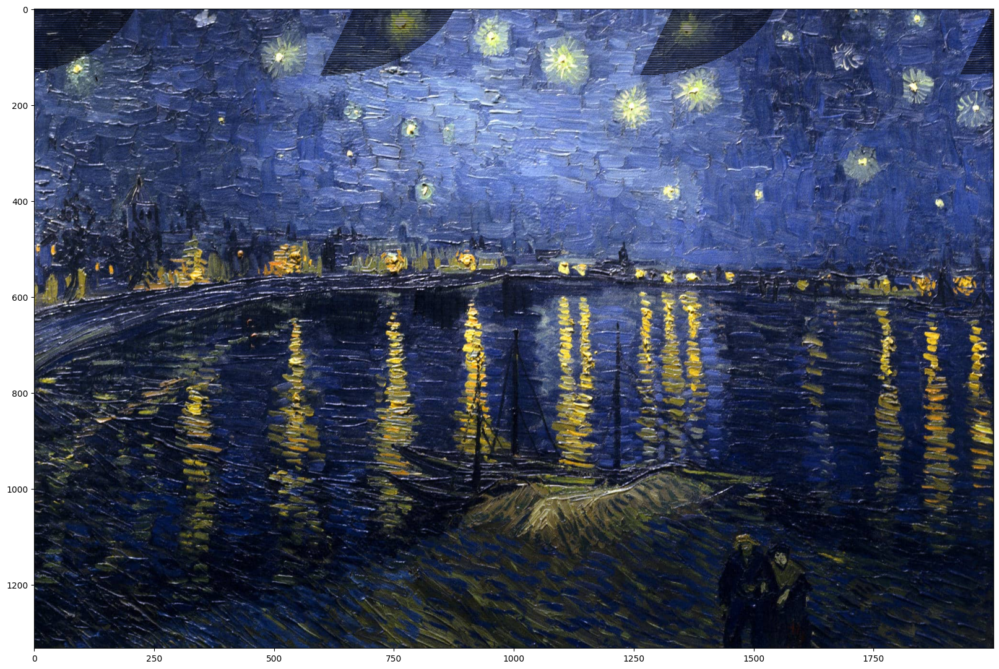

In [22]:
startTimer('filterImageOnGPU')
figure = plt.figure()
figure.set_size_inches(20, 20)
im = Image.open('raw_data/vangogh2.jpg')            
target_Im = numpy.array(im).astype(numpy.float32)
test_Im = daw_circle_onImage(target_Im, target_Im, draw_func,[10,10],200)
imshow(test_Im)
stopTimer()

In [13]:
import cv2 as cv

drawing = False # true if mouse is pressed
img_1 = cv.imread('vangogh3.jpg')
img_2 = cv.imread('vangogh3.jpg')
radius = 0

# mouse callback function
def paint_brush(event,x,y,flags,param):
    global drawing,img_1, img_2,radius
    if event == cv.EVENT_LBUTTONDOWN:
        drawing = True
        if radius > 0:
            img_1 = daw_circle_onImageOnGPU('vangogh3.jpg',score_func,[x,y],radius)
            img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
    elif event == cv.EVENT_MOUSEMOVE:
        if drawing == True and radius > 0:
            img_1 = daw_circle_onImageOnGPU('vangogh3.jpg',score_func,[x,y],radius)
            img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
    elif event == cv.EVENT_LBUTTONUP:
        drawing = False
        img_1 = img_2
    else:
        pass
    
def nothing(x):
    pass

cv.namedWindow('image')

# create trackbars for color change
# create trackbar for color change
cv.createTrackbar('Brush radius', 'image',10,100,nothing)
cv.setMouseCallback('image',paint_brush)
while(1):
    cv.imshow('image',img_1)
    k = cv.waitKey(1) & 0xFF
    if k == ord('q'):
        break
    # get current positions of four trackbars
    radius = cv.getTrackbarPos('Brush radius','image')
    
cv.destroyAllWindows()

[ WARN:0@0.070] global loadsave.cpp:248 findDecoder imread_('vangogh3.jpg'): can't open/read file: check file path/integrity
[ WARN:0@0.071] global loadsave.cpp:248 findDecoder imread_('vangogh3.jpg'): can't open/read file: check file path/integrity


error: OpenCV(4.9.0) /io/opencv/modules/highgui/src/window.cpp:971: error: (-215:Assertion failed) size.width>0 && size.height>0 in function 'imshow'


# Draw multiple circles and score them

In [32]:
kernel_score = """
    
    __global__ void mult_circle_score(float *score, float *targetIm, float *testIm, int check, float *x_coordinates, float *y_coordinates, float* radius, int im_size, int nbr_circles){
        int idx = (threadIdx.x ) + blockDim.x * blockIdx.x ;
        int pixel_y = idx / im_size ;
        int pixel_x = idx % im_size ;
        for(int c = 0; c < nbr_circles; c++){
            float dist_from_center = (pixel_x-x_coordinates[c])*(pixel_x-x_coordinates[c]) + (pixel_y-y_coordinates[c])*(pixel_y-y_coordinates[c]) ;
            float color[3]{0,0,0};
            // getting color
            int count = 0;
            int id = (y_coordinates[c])*im_size + x_coordinates[c];
            color[0] = color[0] + targetIm[3*id];
            color[1] = color[1] + targetIm[3*id+1];
            color[2] = color[2] + targetIm[3*id+2];
            count++;
            for(int i = 0; i<100; i++){
                for(int j = 0; j<100; j++){
                    
                    int id = (y_coordinates[c]+j)*im_size + x_coordinates[c]+i;
                    if (i*i+j*j<radius[c]*radius[c] && id < check && id > 0){
                      
                      color[0] = color[0] + targetIm[3*id];
                      color[1] = color[1] + targetIm[3*id+1];
                      color[2] = color[2] + targetIm[3*id+2];
                      count++;
                      }
                    id = (y_coordinates[c]-j)*im_size + x_coordinates[c]+i;
                    if (i*i+j*j<radius[c]*radius[c] && id < check && id > 0){
                      
                      color[0] = color[0] + targetIm[3*id];
                      color[1] = color[1] + targetIm[3*id+1];
                      color[2] = color[2] + targetIm[3*id+2];
                      count++;
                      }
                    id = (y_coordinates[c]-j)*im_size + x_coordinates[c]-i;
                    if (i*i+j*j<radius[c]*radius[c]  && id < check && id > 0){
                      
                      color[0] = color[0] + targetIm[3*id];
                      color[1] = color[1] + targetIm[3*id+1];
                      color[2] = color[2] + targetIm[3*id+2];
                      count++;
                      }
                    id = (y_coordinates[c]+j)*im_size + x_coordinates[c]-i;
                    if (i*i+j*j<radius[c]*radius[c] && id < check && id > 0){
                      
                      color[0] = color[0] + targetIm[3*id];
                      color[1] = color[1] + targetIm[3*id+1];
                      color[2] = color[2] + targetIm[3*id+2];
                      count++;
                      }
                }
        	}
            color[0] = color[0] / count;
            color[1] = color[1] / count;
            color[2] = color[2] / count;
            
            if(idx *3 < check*3 && dist_from_center < radius[c]*radius[c])
            {
                
            
            //assign color

            float color_swap[3]{testIm[idx*3],testIm[idx*3+1],testIm[idx*3+2]};
            
            testIm[idx*3]= color[0];
            testIm[idx*3+1]= color[1];
            testIm[idx*3+2]= color[2];
            
            score[c] = score[c] + abs(testIm[idx*3]-targetIm[idx*3])+abs(testIm[idx*3+1]-targetIm[idx*3+1])+abs(testIm[idx*3+2]-targetIm[idx*3+2]);

            testIm[idx*3]= color_swap[0];
            testIm[idx*3+1]= color_swap[1];
            testIm[idx*3+2]= color_swap[2];
            }
            else { score[c] = score[c] + abs(testIm[idx*3]-targetIm[idx*3])+abs(testIm[idx*3+1]-targetIm[idx*3+1])+abs(testIm[idx*3+2]-targetIm[idx*3+2]); }
        }
    }

    """
#Compile and get kernel function
mod = SourceModule(kernel_score)
print(mod)
mult_circle_score_func = mod.get_function("mult_circle_score")
print(mult_circle_score_func)

In [33]:
def daw_n_circles_onImageOnGPU(target_Im, Func, nbr_circles, test_Im):
    im = target_Im            
    px = numpy.array(im).astype(numpy.float32)
        
    # print('Size:' + str(im.shape))
    # print('Pixels:' + str (im.shape[0]*im.shape[1]))
    
    d_px = cuda.mem_alloc(test_Im.nbytes)
    cuda.memcpy_htod(d_px, test_Im)
    target_px = cuda.mem_alloc(px.nbytes)
    cuda.memcpy_htod(target_px, px)
      
    BLOCK_SIZE = 1024
    block = (BLOCK_SIZE,1,1)
    # print ('Block:' + str (block))
    totalPixels = numpy.int32(im.shape[0]*im.shape[1])
    # print ('TotalPixels:' + str (totalPixels))
    gridRounded=int(im.shape[0]*im.shape[1]/BLOCK_SIZE)+1
    # print ('GridRounded:' + str (gridRounded))
    # print ('BLOCK_SIZE * GridRounded:' + str (gridRounded*BLOCK_SIZE))
    grid = (gridRounded,1,1)
    # print ('Grid:' + str (grid))

    random_x = [numpy.floor(x) for x in list(np.random.rand(nbr_circles)*im.shape[0])]
    x_coordinates = numpy.array(random_x).astype(numpy.int32)
    x_coord = cuda.mem_alloc(x_coordinates.nbytes)
    cuda.memcpy_htod(x_coord,x_coordinates)

    random_y = [np.floor(x) for x in list(np.random.rand(nbr_circles)*im.shape[1])]
    y_coordinates = numpy.array(random_y).astype(numpy.float32)
    y_coord = cuda.mem_alloc(y_coordinates.nbytes)
    cuda.memcpy_htod(y_coord,y_coordinates)

    score = np.zeros(nbr_circles).astype(numpy.float32)
    score_cuda = cuda.mem_alloc(score.nbytes)
    cuda.memcpy_htod(score_cuda,score)

    random_rad = np.random.rand(nbr_circles)*200 + np.ones(nbr_circles)*10
    radius = random_rad.astype(numpy.float32)
    radius_cuda = cuda.mem_alloc(radius.nbytes)
    cuda.memcpy_htod(radius_cuda,radius)

    """float *score, float *targetIm, float *testIm, int check, float *x_coordinates, float *y_coordinates, float* radius, int im_size, int nbr_circles"""
    Func(score_cuda, target_px, d_px, totalPixels, x_coord, y_coord, radius_cuda, numpy.int32(im.shape[0]), numpy.int32(nbr_circles), block=block, grid = grid)
   
    cuda.memcpy_dtoh(score, score_cuda)
    
    
    return score, x_coordinates, y_coordinates, radius

Draw circle
DONE in 4.70920277 seconds.


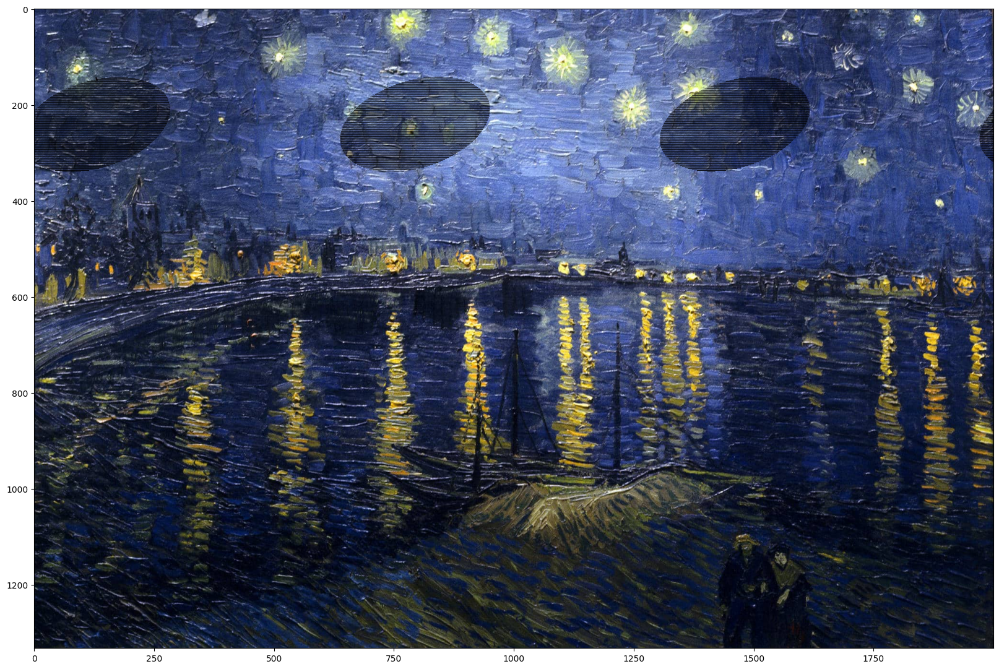

In [34]:

im = Image.open('raw_data/vangogh2.jpg')            
target_Im = numpy.array(im).astype(numpy.float32)
test_Im = np.zeros_like(target_Im).astype(numpy.float32)

startTimer('Draw circle')
score, x_coordinates, y_coordinates, radius = daw_n_circles_onImageOnGPU(target_Im, mult_circle_score_func, 10, test_Im)
x_coordinates = [x for _, x in sorted(zip(score, x_coordinates))]
y_coordinates = [x for _, x in sorted(zip(score, y_coordinates))]
radius = [x for _, x in sorted(zip(score, radius))]
radius, coordinates = radius[0], [x_coordinates[0], y_coordinates[0]]
figure = plt.figure()
figure.set_size_inches(20, 20)
test_Im = daw_circle_onImage(test_Im, target_Im, draw_func,coordinates,radius)
imshow(test_Im)

stopTimer()

In [ ]:
score, x_coordinates, y_coordinates, radius

In [ ]:
x_coordinates = [x for _, x in sorted(zip(score, x_coordinates))]
y_coordinates = [x for _, x in sorted(zip(score, y_coordinates))]
radius = [x for _, x in sorted(zip(score, radius))]